In [1]:
cd /g/data/jk72/deg581/vanom/ana/notebooks

/g/data/jk72/deg581/vanom/ana/notebooks


In [2]:
# load modules
## Data processing and DA modules
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import inset_axes, zoomed_inset_axes
## Dealing with big data and netcdf
import xarray as xr
from netCDF4 import Dataset
## ROMS packages
from xgcm import Grid
## color maps
import cmaps
import cmocean
## mapping packages
import cartopy.crs as ccrs
import cartopy.feature as cfeature
## System tools and python configuration
import os
import glob
import repackage
repackage.add('../../')
repackage.add('../')

'/jobfs/111312791.gadi-pbs'

In [3]:
# Suite for Analysis - Overview

# script needs to:
# load 1-5 variables from multiple files
# run some calculation and concatenate together
# make some plots

In [4]:


FilePath='/g/data/jk72/deg581/vanom/mdl/vanderford_repeatyear_2007_bm3/' # Truth file settings
prefix='roms_his_'
timeRange = [5, 7]
datelist = np.array(range(timeRange[0],timeRange[1],1))

def add_zeros_to_4(date):
    if date<10:
        to_add = '000'
    elif date>9 & date<100:
        to_add = '00'
    elif date>99 & date < 1000:
        to_add = '0'
    else: 
        to_add = ''
    return to_add

def generateFileList(FilePath,prefix,datelist):
    filelist=[FilePath+prefix+add_zeros_to_4(datelist[0])+str(datelist[0])+'.nc']
    for dates in datelist[1:]:
        filenameToAppend=FilePath+prefix+add_zeros_to_4(dates)+str(dates)+'.nc'
        filelist.append(filenameToAppend)
    return filelist

fl=generateFileList(FilePath,prefix,datelist)
print(fl)

# ds=loadOverlappedNetcdfFileList(filelist=fl,overlapDays=7)

ds = xr.open_mfdataset(fl,chunks = {'ocean_time':1}, data_vars='minimal', compat='override',coords='minimal',parallel='False',join='right')

print(ds.nbytes/1e9,'G')

['/g/data/jk72/deg581/vanom/mdl/vanderford_repeatyear_2007_bm3/roms_his_0005.nc', '/g/data/jk72/deg581/vanom/mdl/vanderford_repeatyear_2007_bm3/roms_his_0006.nc']
14.888526704 G


In [5]:
ds = ds.drop_vars(['Tb','Sb','ubar_eastward','vbar_northward','w','shflux','ssflux','sustr','svstr'])
print(ds.nbytes/1e9,'G')
ds

12.486914304 G


<xarray.Dataset>
Dimensions:        (tracer: 2, boundary: 4, s_rho: 25, s_w: 26, eta_rho: 220,
                    xi_rho: 110, eta_u: 220, xi_u: 109, eta_v: 219, xi_v: 110,
                    eta_psi: 219, xi_psi: 109, ocean_time: 730)
Coordinates:
  * s_rho          (s_rho) float64 -0.98 -0.94 -0.9 -0.86 ... -0.1 -0.06 -0.02
  * s_w            (s_w) float64 -1.0 -0.96 -0.92 -0.88 ... -0.08 -0.04 0.0
    x_rho          (eta_rho, xi_rho) float64 dask.array<chunksize=(220, 110), meta=np.ndarray>
    y_rho          (eta_rho, xi_rho) float64 dask.array<chunksize=(220, 110), meta=np.ndarray>
    x_u            (eta_u, xi_u) float64 dask.array<chunksize=(220, 109), meta=np.ndarray>
    y_u            (eta_u, xi_u) float64 dask.array<chunksize=(220, 109), meta=np.ndarray>
    x_v            (eta_v, xi_v) float64 dask.array<chunksize=(219, 110), meta=np.ndarray>
    y_v            (eta_v, xi_v) float64 dask.array<chunksize=(219, 110), meta=np.ndarray>
    x_psi          (eta_psi, xi_psi) float64 dask.array<chunksize=(219, 109), meta=np.ndarray>
    y_psi          (eta_psi, xi_psi) float64 dask.array<chunksize=(219, 109), meta=np.ndarray>
  * ocean_time     (ocean_time) datetime64[ns] 2011-01-01 ... 2012-12-30
Dimensions without coordinates: tracer, boundary, eta_rho, xi_rho, eta_u, xi_u,
                                eta_v, xi_v, eta_psi, xi_psi
Data variables: (12/79)
    ntimes         int32 ...
    ndtfast        int32 ...
    dt             float64 ...
    dtfast         float64 ...
    dstart         datetime64[ns] ...
    nHIS           int32 ...
    ...             ...
    v              (ocean_time, s_rho, eta_v, xi_v) float32 dask.array<chunksize=(1, 25, 219, 110), meta=np.ndarray>
    u_eastward     (ocean_time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 25, 220, 110), meta=np.ndarray>
    v_northward    (ocean_time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 25, 220, 110), meta=np.ndarray>
    temp           (ocean_time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 25, 220, 110), meta=np.ndarray>
    salt           (ocean_time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 25, 220, 110), meta=np.ndarray>
    rho            (ocean_time, s_rho, eta_rho, xi_rho) float32 dask.array<chunksize=(1, 25, 220, 110), meta=np.ndarray>
Attributes: (12/34)
    file:              roms_his_0005.nc
    format:            netCDF-3 64bit offset file
    Conventions:       CF-1.4, SGRID-0.3
    type:              ROMS/TOMS history file
    title:             Vanderford Ice Shelf-ocean Application
    var_info:          ROMS/External/varinfo.yaml
    ...                ...
    compiler_command:  /apps/openmpi/4.0.2/bin/mpif90
    compiler_flags:    -fp-model precise -heap-arrays -ip -O3 -traceback -che...
    tiling:            016x018
    history:           ROMS/TOMS, Version 4.1, Thursday - March 14, 2024 -  6...
    ana_file:          ROMS/Functionals/ana_btflux.h, ROMS/Functionals/ana_sr...
    CPP_options:       VANDERFORD, ANA_BSFLUX, ANA_BTFLUX, ANA_INITIAL, ANA_S...

In [6]:
ds_bm = ds

In [7]:


FilePath='/g/data/jk72/deg581/vanom/mdl/vanderford_repeatyear_2007_bm3Modv1/' # Truth file settings
prefix='roms_his_'
timeRange = [5, 7]
datelist = np.array(range(timeRange[0],timeRange[1],1))

def add_zeros_to_4(date):
    if date<10:
        to_add = '000'
    elif date>9 & date<100:
        to_add = '00'
    elif date>99 & date < 1000:
        to_add = '0'
    else: 
        to_add = ''
    return to_add

def generateFileList(FilePath,prefix,datelist):
    filelist=[FilePath+prefix+add_zeros_to_4(datelist[0])+str(datelist[0])+'.nc']
    for dates in datelist[1:]:
        filenameToAppend=FilePath+prefix+add_zeros_to_4(dates)+str(dates)+'.nc'
        filelist.append(filenameToAppend)
    return filelist

fl=generateFileList(FilePath,prefix,datelist)
print(fl)

# ds=loadOverlappedNetcdfFileList(filelist=fl,overlapDays=7)

ds = xr.open_mfdataset(fl,chunks = {'ocean_time':1}, data_vars='minimal', compat='override',coords='minimal',parallel='False',join='right')

print(ds.nbytes/1e9,'G')

ds = ds.drop_vars(['Tb','Sb','ubar_eastward','vbar_northward','w','shflux','ssflux','sustr','svstr'])
print(ds.nbytes/1e9,'G')
ds

ds_lb1 = ds

['/g/data/jk72/deg581/vanom/mdl/vanderford_repeatyear_2007_bm3Modv1/roms_his_0005.nc', '/g/data/jk72/deg581/vanom/mdl/vanderford_repeatyear_2007_bm3Modv1/roms_his_0006.nc']
14.888526704 G
12.486914304 G


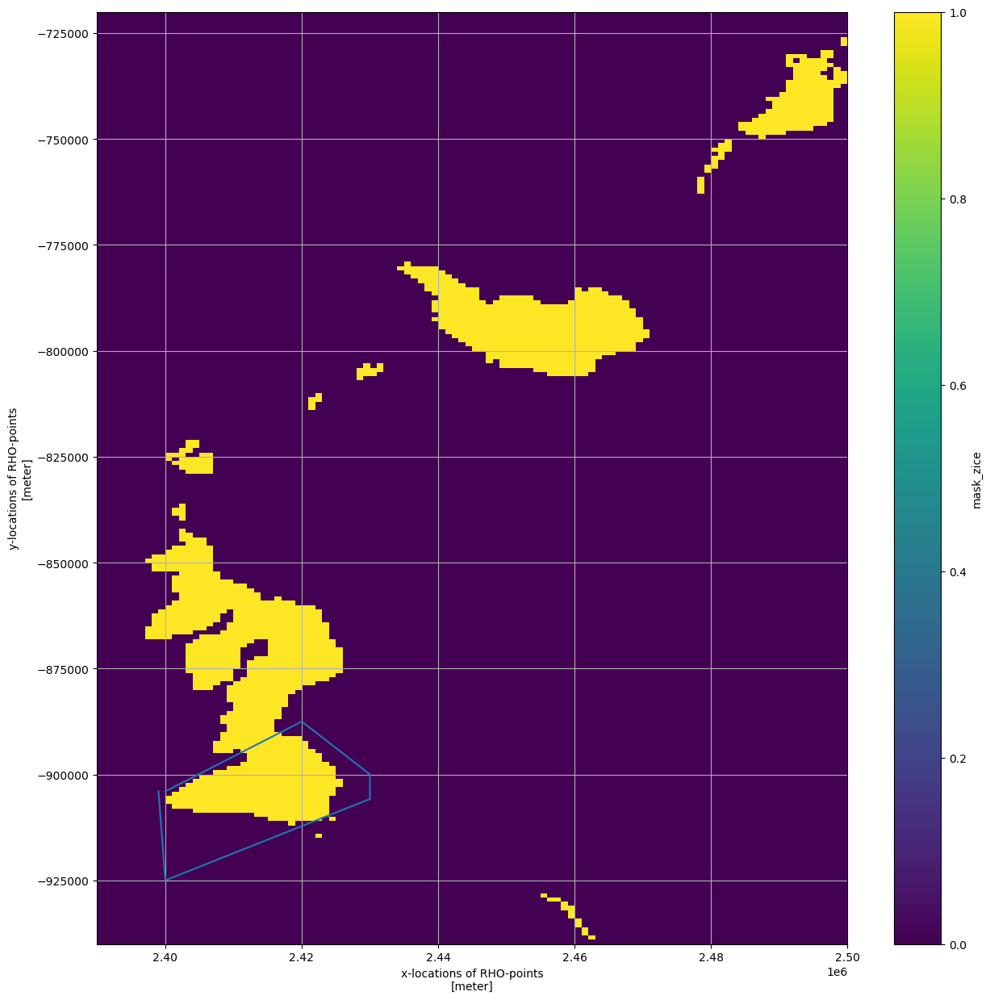

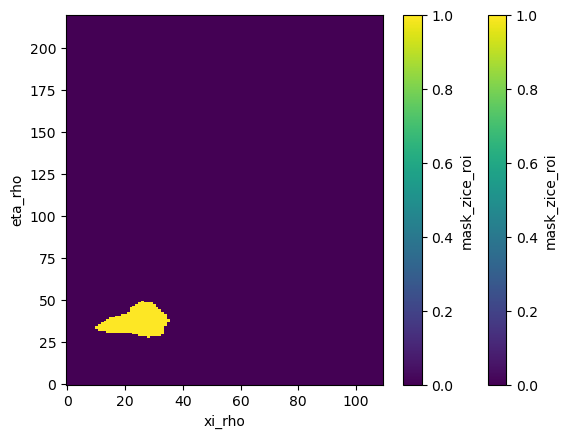

In [8]:
# make masks
ds_bm['mask_zice'] = ((ds_bm.zice<0)*ds_bm.mask_rho)
ds_lb1['mask_zice'] = ((ds_lb1.zice<0)*ds_lb1.mask_rho)

# now make a ROI mask(s)
plt.figure(figsize=(15,15))
ds_bm.mask_zice.plot(x='x_rho',y='y_rho')
plt.grid()
poly_shelf = np.array([
    [2.399e6,-904000],
    [2.4e6,-925000],
    [2.43e6,-905800],
    [2.43e6,-900000],
    [2.42e6,-887500],
    [2.4e6,-904000]])
plt.plot(poly_shelf[:,0],poly_shelf[:,1])
plt.show()

def inpolygon(xq, yq, xv, yv):
    from matplotlib import path
    shape = xq.shape
    xq = xq.reshape(-1)
    yq = yq.reshape(-1)
    xv = xv.reshape(-1)
    yv = yv.reshape(-1)
    q = [(xq[i], yq[i]) for i in range(xq.shape[0])]
    p = path.Path([(xv[i], yv[i]) for i in range(xv.shape[0])])
    return p.contains_points(q).reshape(shape)


mask_roi = inpolygon(ds_bm.x_rho.values, ds_bm.y_rho.values,poly_shelf[:,0], poly_shelf[:,1])


ds_bm['mask_zice_roi'] = ds_bm.mask_zice*mask_roi
ds_bm.mask_zice_roi.plot()

ds_lb1['mask_zice_roi'] = ds_lb1.mask_zice*mask_roi
ds_lb1.mask_zice_roi.plot()

In [9]:
# set any grid data here.

weights = (1/ds.pm)*(1/ds.pn)
weights.name = "weights"

print('making vertical coordinates')
Zo_rho = (ds_bm.hc * ds_bm.s_rho + ds_bm.Cs_r * ds_bm.h) / (ds_bm.hc + ds_bm.h)
z_rho = ds_bm.zeta + (ds_bm.zeta + ds_bm.h) * Zo_rho
Zo_w = (ds_bm.hc * ds_bm.s_w + ds_bm.Cs_w * ds_bm.h) / (ds_bm.hc + ds_bm.h)
z_w = Zo_w * (ds_bm.zeta + ds_bm.h) + ds_bm.zeta
    
ds_bm.coords['z_w'] = z_w.where(ds_bm.mask_rho, 0).transpose('ocean_time', 's_w', 'eta_rho', 'xi_rho')
ds_bm.coords['z_rho'] = z_rho.where(ds_bm.mask_rho, 0).transpose('ocean_time', 's_rho', 'eta_rho', 'xi_rho')
ds_bm.coords['z_rho0'] = z_rho.mean(dim='ocean_time')
ds_bm["z_rho0"] = ds_bm.z_rho0.fillna(0)

ds_bm['dz'] = (('ocean_time','s_rho', 'eta_rho', 'xi_rho'),np.diff(ds_bm.z_w,axis=1))



making vertical coordinates


In [10]:
# set any grid data here.

print('making vertical coordinates')
Zo_rho = (ds_lb1.hc * ds_lb1.s_rho + ds_lb1.Cs_r * ds_lb1.h) / (ds_lb1.hc + ds_lb1.h)
z_rho = ds_lb1.zeta + (ds_lb1.zeta + ds_lb1.h) * Zo_rho
Zo_w = (ds_lb1.hc * ds_lb1.s_w + ds_lb1.Cs_w * ds_lb1.h) / (ds_lb1.hc + ds_lb1.h)
z_w = Zo_w * (ds_lb1.zeta + ds_lb1.h) + ds_lb1.zeta
    
ds_lb1.coords['z_w'] = z_w.where(ds_lb1.mask_rho, 0).transpose('ocean_time', 's_w', 'eta_rho', 'xi_rho')
ds_lb1.coords['z_rho'] = z_rho.where(ds_lb1.mask_rho, 0).transpose('ocean_time', 's_rho', 'eta_rho', 'xi_rho')
ds_lb1.coords['z_rho0'] = z_rho.mean(dim='ocean_time')
ds_lb1["z_rho0"] = ds_lb1.z_rho0.fillna(0)

ds_lb1['dz'] = (('ocean_time','s_rho', 'eta_rho', 'xi_rho'),np.diff(ds_lb1.z_w,axis=1))



making vertical coordinates


In [11]:
# map u,v to rho points
def ROMSmetricsAndGrid(ds):
    ds = ds.rename({'eta_u': 'eta_rho', 'xi_v': 'xi_rho', 'xi_psi': 'xi_u', 'eta_psi': 'eta_v'})

    coords={'X':{'center':'xi_rho', 'inner':'xi_u'}, 
        'Y':{'center':'eta_rho', 'inner':'eta_v'}, 
        'Z':{'center':'s_rho', 'outer':'s_w'}}

    grid = Grid(ds, coords=coords, periodic=[])


    ds['pm_v'] = grid.interp(ds.pm, 'Y')
    ds['pn_u'] = grid.interp(ds.pn, 'X')
    ds['pm_u'] = grid.interp(ds.pm, 'X')
    ds['pn_v'] = grid.interp(ds.pn, 'Y')
    ds['pm_psi'] = grid.interp(grid.interp(ds.pm, 'Y'),  'X') # at psi points (eta_v, xi_u) 
    ds['pn_psi'] = grid.interp(grid.interp(ds.pn, 'X'),  'Y') # at psi points (eta_v, xi_u)

    ds['dx'] = 1/ds.pm
    ds['dx_u'] = 1/ds.pm_u
    ds['dx_v'] = 1/ds.pm_v
    ds['dx_psi'] = 1/ds.pm_psi

    ds['dy'] = 1/ds.pn
    ds['dy_u'] = 1/ds.pn_u
    ds['dy_v'] = 1/ds.pn_v
    ds['dy_psi'] = 1/ds.pn_psi

#     ds['dz'] = grid.diff(ds.z_w, 'Z', boundary='fill')
#     ds['dz_w'] = grid.diff(ds.z_rho, 'Z', boundary='fill')
#     ds['dz_u'] = grid.interp(ds.dz, 'X')
#     ds['dz_w_u'] = grid.interp(ds.dz_w, 'X')
#     ds['dz_v'] = grid.interp(ds.dz, 'Y')
#     ds['dz_w_v'] = grid.interp(ds.dz_w, 'Y')

    ds['dA'] = ds.dx * ds.dy

    metrics = {
        ('X',): ['dx', 'dx_u', 'dx_v', 'dx_psi'], # X distances
        ('Y',): ['dy', 'dy_u', 'dy_v', 'dy_psi'], # Y distances
        # ('Z',): ['dz', 'dz_u', 'dz_v', 'dz_w', 'dz_w_u', 'dz_w_v'], # Z distances
        ('X', 'Y'): ['dA'] # Areas
    }
    grid = Grid(ds, coords=coords, metrics=metrics, periodic=[])

    return ds,grid


ds_bm, grid = ROMSmetricsAndGrid(ds_bm)
ds_bm['u_rho'] = grid.interp(ds_bm.u,'X')
ds_bm['v_rho'] = grid.interp(ds_bm.v,'Y')

ds_lb1, grid = ROMSmetricsAndGrid(ds_lb1)
ds_lb1['u_rho'] = grid.interp(ds_lb1.u,'X')
ds_lb1['v_rho'] = grid.interp(ds_lb1.v,'Y')

# make doy/month averages

In [12]:
# calculate the month length for each value
month_length = ds_bm.ocean_time.dt.days_in_month
## Calculate the weights by grouping by 'time.season'.
weights = (month_length.groupby("ocean_time.season") / month_length.groupby("ocean_time.season").sum())
ds_bm_dailyclima = ds_bm.groupby('ocean_time.dayofyear').mean()
# weights = (month_length.groupby("time.month") / month_length.groupby("time.month").sum())
# ds_bm_monclima = (ds_bm * weights).groupby("time.month").sum(dim="time")
# Test that the sum of the weights for each season is 1.0
# Calculate the weighted average
# ds_weighted = (ds * weights).groupby("time.season").sum(dim="time")


month_length = ds_lb1.ocean_time.dt.days_in_month
## Calculate the weights by grouping by 'time.season'.
weights = (month_length.groupby("ocean_time.season") / month_length.groupby("ocean_time.season").sum())
ds_lb1_dailyclima = ds_lb1.groupby('ocean_time.dayofyear').mean()


In [13]:
#now make monthly datasets

ds_bm_monclima = ds_bm.groupby('ocean_time.month').mean('ocean_time')
ds_lb1_monclima = ds_lb1.groupby('ocean_time.month').mean('ocean_time')

# Make some mean plots

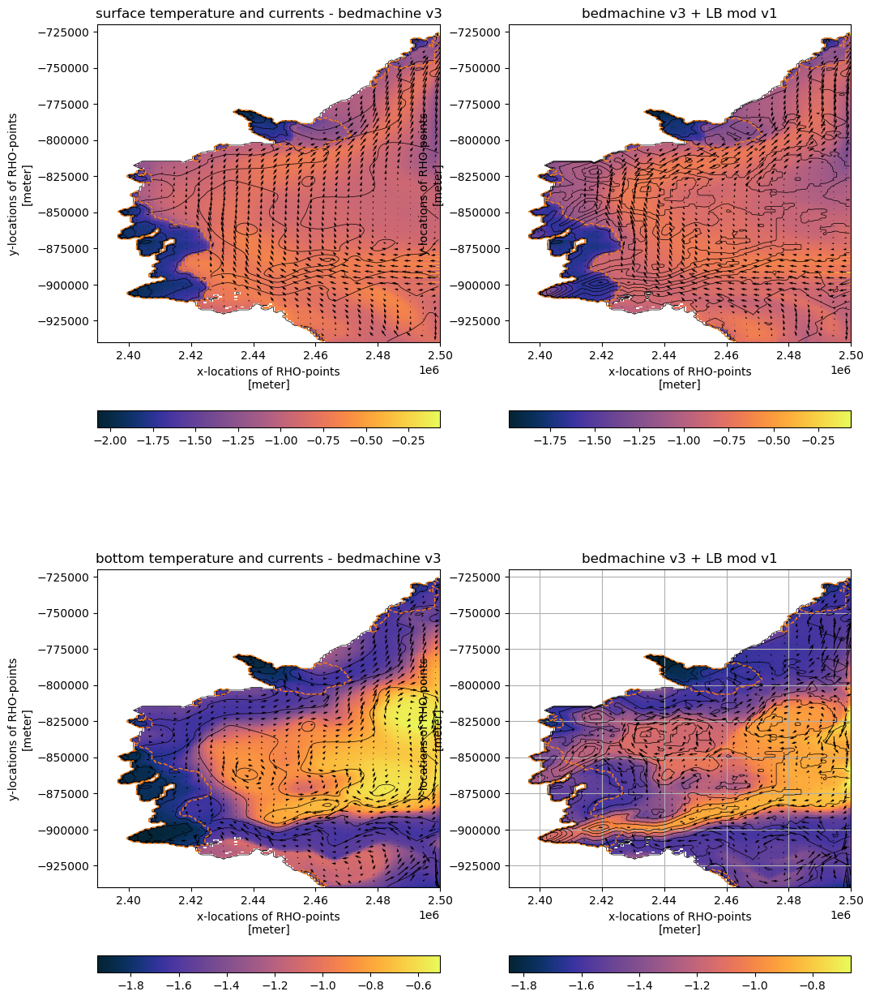

In [14]:
res=4

fig,axs=plt.subplots(nrows=2,ncols=2,figsize=(12,16))
ax = axs[0,0]
im=(ds_bm_dailyclima.temp).isel(s_rho=-1).mean(dim='dayofyear').plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_bm.h*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_bm.zice*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_bm_dailyclima.u_rho.isel(s_rho=-1).mean(dim='dayofyear')[0:-1:res,0:-1:res], ds_bm_dailyclima.v_rho.isel(s_rho=-1).mean(dim='dayofyear')[0:-1:res,0:-1:res],angles='uv')
ax.set_title('surface temperature and currents - bedmachine v3')
plt.grid()
ax = axs[0,1]
im=(ds_lb1_dailyclima.temp).isel(s_rho=-1).mean(dim='dayofyear').plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_lb1.h*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_lb1.zice*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_lb1_dailyclima.u_rho.isel(s_rho=-1).mean(dim='dayofyear')[0:-1:res,0:-1:res], ds_lb1_dailyclima.v_rho.isel(s_rho=-1).mean(dim='dayofyear')[0:-1:res,0:-1:res],angles='uv')
ax.set_title('bedmachine v3 + LB mod v1')
plt.grid()
ax = axs[1,0]
im=(ds_bm_dailyclima.temp).isel(s_rho=0).mean(dim='dayofyear').plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_bm.h*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_bm.zice*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_bm_dailyclima.u_rho.isel(s_rho=0).mean(dim='dayofyear')[0:-1:res,0:-1:res], ds_bm_dailyclima.v_rho.isel(s_rho=0).mean(dim='dayofyear')[0:-1:res,0:-1:res],angles='uv')
ax.set_title('bottom temperature and currents - bedmachine v3')
plt.grid()
ax = axs[1,1]
im=(ds_lb1_dailyclima.temp).isel(s_rho=0).mean(dim='dayofyear').plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_lb1.h*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_lb1.zice*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_lb1_dailyclima.u_rho.isel(s_rho=0).mean(dim='dayofyear')[0:-1:res,0:-1:res], ds_lb1_dailyclima.v_rho.isel(s_rho=0).mean(dim='dayofyear')[0:-1:res,0:-1:res],angles='uv')
ax.set_title('bedmachine v3 + LB mod v1')
plt.grid()
plt.show()


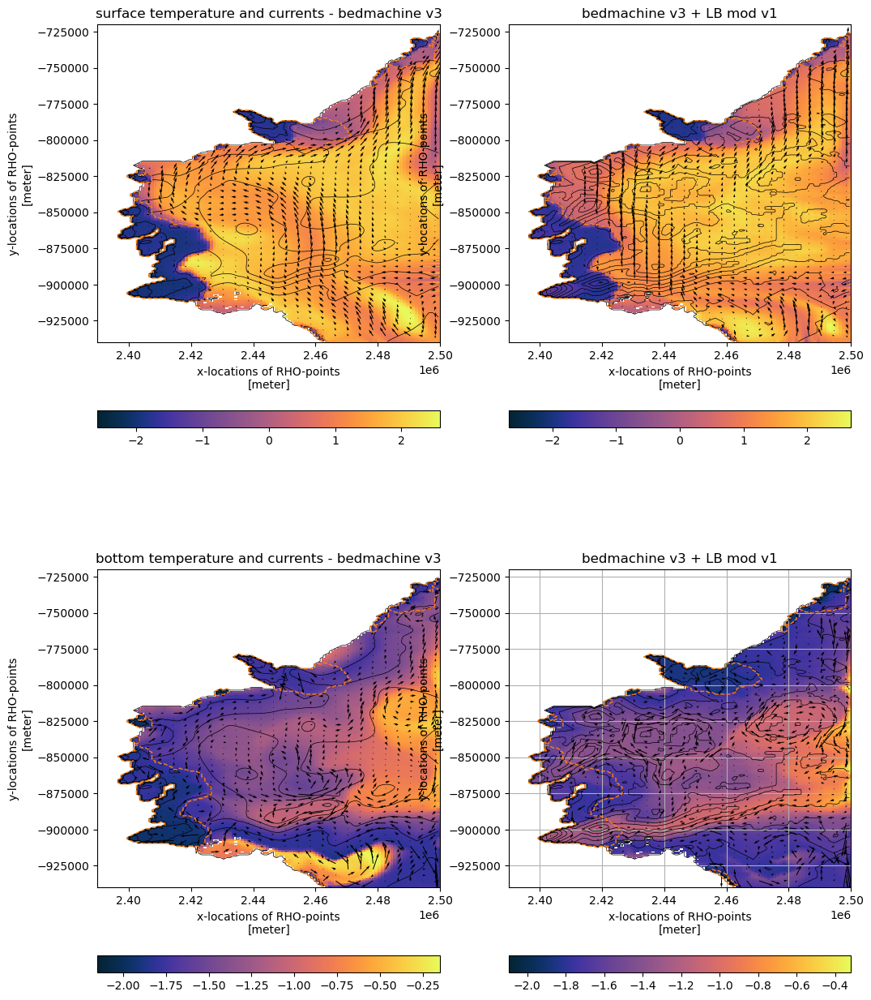

In [15]:
res=4

mon_sel=1
fig,axs=plt.subplots(nrows=2,ncols=2,figsize=(12,16))
ax = axs[0,0]
im=(ds_bm_monclima.temp).isel(s_rho=-1).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_bm.h*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_bm.zice*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_bm_monclima.u_rho.isel(s_rho=-1).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_bm_monclima.v_rho.isel(s_rho=-1).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
ax.set_title('surface temperature and currents - bedmachine v3')
plt.grid()
ax = axs[0,1]
im=(ds_lb1_monclima.temp).isel(s_rho=-1).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_lb1.h*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_lb1.zice*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_lb1_monclima.u_rho.isel(s_rho=-10).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_lb1_monclima.v_rho.isel(s_rho=-1).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
ax.set_title('bedmachine v3 + LB mod v1')
plt.grid()
ax = axs[1,0]
im=(ds_bm_monclima.temp).isel(s_rho=0).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_bm.h*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_bm.zice*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_bm_monclima.u_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_bm_monclima.v_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
ax.set_title('bottom temperature and currents - bedmachine v3')
plt.grid()
ax = axs[1,1]
im=(ds_lb1_monclima.temp).isel(s_rho=0).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_lb1.h*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_lb1.zice*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_lb1_monclima.u_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_lb1_monclima.v_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
ax.set_title('bedmachine v3 + LB mod v1')
plt.grid()
plt.show()


In [16]:


import matplotlib.animation as animation

res=4
mon_sel=1
fig,axs=plt.subplots(ncols=2,figsize=(12,8))
ax = axs[0]
im1=(ds_bm_monclima.temp).isel(s_rho=-1).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_bm.h*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_bm.zice*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
q1=ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_bm_monclima.u_rho.isel(s_rho=-1).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_bm_monclima.v_rho.isel(s_rho=-1).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
ax.set_title('surface temperature and currents - bedmachine v3')
plt.grid()
ax = axs[1]
im2=(ds_lb1_monclima.temp).isel(s_rho=-1).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_lb1.h*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_lb1.zice*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
q2=ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_lb1_monclima.u_rho.isel(s_rho=-1).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_lb1_monclima.v_rho.isel(s_rho=-1).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
ax.set_title('bedmachine v3 + LB mod v1')
plt.grid()
plt.close()
# ax = axs[1,0]
# im=(ds_bm_monclima.temp).isel(s_rho=0).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
# (ds_bm.h*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
# (ds_bm.zice*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
# plt.colorbar(im,orientation='horizontal')
# ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_bm_monclima.u_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_bm_monclima.v_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
# ax.set_title('bottom temperature and currents - bedmachine v3')
# plt.grid()
# ax = axs[1,1]
# im=(ds_lb1_monclima.temp).isel(s_rho=0).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
# (ds_lb1.h*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
# (ds_lb1.zice*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
# plt.colorbar(im,orientation='horizontal')
# ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_lb1_monclima.u_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_lb1_monclima.v_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
# ax.set_title('bedmachine v3 + LB mod v1')
# plt.grid()
# plt.show()

# Next we need to create a function that updates the values for the colormesh, as well as the title.
def animate(frame):
    mon_sel=frame+1
    im1.set_array((ds_bm_monclima.temp).isel(s_rho=-1).sel(month=mon_sel).values.flatten())
    fig.suptitle("surface temperature and currents; Time = " + str(ds_lb1_monclima.coords['month'].values[frame]))
    im2.set_array((ds_lb1_monclima.temp).isel(s_rho=-1).sel(month=mon_sel).values.flatten())
    q1.set_UVC(ds_bm_monclima.u_rho.isel(s_rho=-1).sel(month=mon_sel)[0:-1:res,0:-1:res], 
               ds_bm_monclima.v_rho.isel(s_rho=-1).sel(month=mon_sel)[0:-1:res,0:-1:res])
    q2.set_UVC(ds_lb1_monclima.u_rho.isel(s_rho=-1).sel(month=mon_sel)[0:-1:res,0:-1:res], 
               ds_lb1_monclima.v_rho.isel(s_rho=-1).sel(month=mon_sel)[0:-1:res,0:-1:res])
# Finally, we use the animation module to create the animation.
ani = animation.FuncAnimation(
    fig,             # figure
    animate,         # name of the function above
    frames=12,       # Could also be iterable or list
    interval=200,     # ms between frames
    blit=False
)

from IPython.display import HTML
HTML(ani.to_jshtml())


In [17]:


import matplotlib.animation as animation

res=4
mon_sel=1
fig,axs=plt.subplots(ncols=2,figsize=(12,8))
ax = axs[0]
im1=(ds_bm_monclima.temp).isel(s_rho=0).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_bm.h*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_bm.zice*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
q1=ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_bm_monclima.u_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_bm_monclima.v_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
ax.set_title('surface temperature and currents - bedmachine v3')
plt.grid()
ax = axs[1]
im2=(ds_lb1_monclima.temp).isel(s_rho=0).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
(ds_lb1.h*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
(ds_lb1.zice*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
plt.colorbar(im,orientation='horizontal')
q2=ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_lb1_monclima.u_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_lb1_monclima.v_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
ax.set_title('bedmachine v3 + LB mod v1')
plt.grid()
plt.close()
# ax = axs[1,0]
# im=(ds_bm_monclima.temp).isel(s_rho=0).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
# (ds_bm.h*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
# (ds_bm.zice*ds_bm.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
# plt.colorbar(im,orientation='horizontal')
# ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_bm_monclima.u_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_bm_monclima.v_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
# ax.set_title('bottom temperature and currents - bedmachine v3')
# plt.grid()
# ax = axs[1,1]
# im=(ds_lb1_monclima.temp).isel(s_rho=0).sel(month=mon_sel).plot(ax=ax,x='x_rho',y='y_rho',cmap='cmo.thermal',add_colorbar=False)
# (ds_lb1.h*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=np.arange(0,2500,250),colors='k',linewidths=0.5)
# (ds_lb1.zice*ds_lb1.mask_rho).plot.contour(ax=ax,x='x_rho',y='y_rho',levels=[-1,0],colors='C1',linewidths=1)
# plt.colorbar(im,orientation='horizontal')
# ax.quiver(ds.x_rho[0:-1:res,0:-1:res],ds.y_rho[0:-1:res,0:-1:res], ds_lb1_monclima.u_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res], ds_lb1_monclima.v_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res],angles='uv')
# ax.set_title('bedmachine v3 + LB mod v1')
# plt.grid()
# plt.show()

# Next we need to create a function that updates the values for the colormesh, as well as the title.
def animate(frame):
    mon_sel=frame+1
    im1.set_array((ds_bm_monclima.temp).isel(s_rho=0).sel(month=mon_sel).values.flatten())
    fig.suptitle("bottom temperature and currents; month = " + str(ds_lb1_monclima.coords['month'].values[frame]))
    im2.set_array((ds_lb1_monclima.temp).isel(s_rho=0).sel(month=mon_sel).values.flatten())
    q1.set_UVC(ds_bm_monclima.u_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res], 
               ds_bm_monclima.v_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res])
    q2.set_UVC(ds_lb1_monclima.u_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res], 
               ds_lb1_monclima.v_rho.isel(s_rho=0).sel(month=mon_sel)[0:-1:res,0:-1:res])
# Finally, we use the animation module to create the animation.
ani = animation.FuncAnimation(
    fig,             # figure
    animate,         # name of the function above
    frames=12,       # Could also be iterable or list
    interval=500,     # ms between frames
    blit=False
)

from IPython.display import HTML
HTML(ani.to_jshtml())


In [18]:
STOP

NameError: name 'STOP' is not defined

# melt rates

In [ ]:
# implement the missing value
ds_bm['m'] = ds_bm.m.where(ds_bm.m<1e35,np.NaN)
ds_bm['my'] = ds_bm.m*(60*60*24*365)
ds_lb1['m'] = ds_lb1.m.where(ds_lb1.m<1e35,np.NaN)
ds_lb1['my'] = ds_lb1.m*(60*60*24*365)
# ds_dailyclima['m'] = ds_dailyclima.m.where(ds_dailyclima.m<1e35,np.NaN)
# ds_dailyclima['my'] = ds_dailyclima.m*(60*60*24*365)

In [ ]:
# time evolution of melt rate
plt.figure(figsize=(8,4))
(ds_bm.my*ds_bm.mask_zice.where(ds_bm.mask_zice,np.NaN)).weighted(weights).mean(('eta_rho','xi_rho')).plot(linewidth=1,label='total')
(ds_bm.my*ds_bm.mask_zice_roi.where(ds_bm.mask_zice_roi,np.NaN)).weighted(weights).mean(('eta_rho','xi_rho')).plot(linewidth=1,label='roi')
plt.legend(frameon=False)
plt.title('melt rate evolution')
plt.grid()
plt.show()


In [ ]:
(ds_bm.my*ds_bm.mask_zice_roi.where(ds_bm.mask_zice_roi,np.NaN)).weighted(weights).mean(('eta_rho','xi_rho')).plot(linewidth=1,label='bedmachine')
plt.show()
(ds_lb1.my*ds_lb1.mask_zice_roi.where(ds_lb1.mask_zice_roi,np.NaN)).weighted(weights).mean(('eta_rho','xi_rho')).plot(linewidth=1,label='bedmachine - mod LB v1')


In [ ]:
# (ds_dailyclima.my*ds.mask_zice_roi.where(ds.mask_zice_roi,np.NaN)).weighted(weights).mean(('eta_rho','xi_rho')).mean(dim='ocean_time').plot(linewidth=1,label='roi')

In [ ]:
plt.figure(figsize=(4,8))
im=(ds_bm.my*ds_bm.mask_zice.where(ds_bm.mask_zice,np.NaN)).mean(dim='ocean_time').plot(x='x_rho',y='y_rho',cmap='cmo.amp',add_colorbar=False)
plt.title('melt rate evolution')
plt.colorbar(im,orientation='horizontal')
plt.grid()
plt.show()

plt.figure(figsize=(4,8))
im=(ds_bm.my*ds_bm.mask_zice.where(ds_bm.mask_zice,np.NaN)).mean(dim='ocean_time').plot(x='x_rho',y='y_rho',cmap='cmo.amp',add_colorbar=False)
plt.axis((2.4e6,2.427e6,-912500,-887500))
plt.title('melt rate evolution')
plt.colorbar(im,orientation='horizontal')
plt.grid()
plt.show()

In [ ]:
plt.figure(figsize=(4,8))
im=(ds_lb1.my*ds_lb1.mask_zice.where(ds_lb1.mask_zice,np.NaN)).mean(dim='ocean_time').plot(x='x_rho',y='y_rho',cmap='cmo.amp',add_colorbar=False)
plt.colorbar(im,orientation='horizontal')
plt.grid()
plt.show()

plt.figure(figsize=(4,8))
im=(ds_lb1.my*ds_lb1.mask_zice.where(ds_lb1.mask_zice,np.NaN)).mean(dim='ocean_time').plot(x='x_rho',y='y_rho',cmap='cmo.amp',add_colorbar=False)
plt.axis((2.4e6,2.427e6,-912500,-887500))
plt.colorbar(im,orientation='horizontal')
plt.grid()
plt.show()

In [ ]:

plt.figure(figsize=(4,8))
im=((ds_lb1.my*ds_lb1.mask_zice.where(ds_lb1.mask_zice,np.NaN)).mean(dim='ocean_time')-(ds_bm.my*ds_bm.mask_zice.where(ds_lb1.mask_zice,np.NaN)).mean(dim='ocean_time')).plot(x='x_rho',y='y_rho',cmap='cmo.balance',add_colorbar=False)
plt.colorbar(im,orientation='horizontal')
co = ((ds_lb1.my*ds_lb1.mask_zice.where(ds_lb1.mask_zice,np.NaN)).mean(dim='ocean_time')-(ds_bm.my*ds_bm.mask_zice.where(ds_lb1.mask_zice,np.NaN)).mean(dim='ocean_time')).plot.contour(x='x_rho',y='y_rho',colors='k',levels=(-20,-15,-10,-5,0,5,10,15,20,25))
plt.grid()
plt.show()

plt.figure(figsize=(4,8))
im=((ds_lb1.my*ds_lb1.mask_zice.where(ds_lb1.mask_zice,np.NaN)).mean(dim='ocean_time')-(ds_bm.my*ds_bm.mask_zice.where(ds_lb1.mask_zice,np.NaN)).mean(dim='ocean_time')).plot(x='x_rho',y='y_rho',cmap='cmo.balance',add_colorbar=False)
plt.colorbar(im,orientation='horizontal')
co = ((ds_lb1.my*ds_lb1.mask_zice.where(ds_lb1.mask_zice,np.NaN)).mean(dim='ocean_time')-(ds_bm.my*ds_bm.mask_zice.where(ds_lb1.mask_zice,np.NaN)).mean(dim='ocean_time')).plot.contour(x='x_rho',y='y_rho',colors='k',levels=(-20,-15,-10,-5,0,5,10,15,20,25))
plt.axis((2.4e6,2.427e6,-912500,-887500))
plt.grid()
plt.show()

In [ ]:
STOP

# ocean heat content

In [ ]:
# plot heat content
#OHC = rho0*cp0*dV*dT
dV = (1/ds.pm)*(1/ds.pn)*ds.dz.mean(dim='ocean_time')
rho0=1026
cp0=4181.3
OHC=1026*4181.3*dV*(ds.temp+273.15)


In [ ]:
# plot total OHC
TotalOHC = OHC.sum(dim='xi_rho').sum(dim='eta_rho').sum(dim='s_rho')
plt.figure(figsize=(8,4))
TotalOHC.plot()
plt.title('Total OHC')
plt.grid()
plt.show()
TotalOHC_above1000 = OHC.where((ds.z_rho0>-1000).compute(), drop=True).sum(dim='xi_rho').sum(dim='eta_rho').sum(dim='s_rho')
plt.figure(figsize=(8,4))
TotalOHC_above1000.plot()
plt.title('Total OHC (above 1000m)')
plt.grid()
plt.show()
TotalOHC_below1000 = OHC.where((ds.z_rho0<-1000).compute(), drop=True).sum(dim='xi_rho').sum(dim='eta_rho').sum(dim='s_rho')
plt.figure(figsize=(8,4))
TotalOHC_below1000.plot()
plt.title('Total OHC (below 1000m)')
plt.grid()

In [ ]:
# plot under ice OHC

TotalOHC_subIce = OHC.where(ds.mask_zice.compute(),drop=True).sum(dim='xi_rho').sum(dim='eta_rho').sum(dim='s_rho')
plt.figure(figsize=(8,4))
TotalOHC_subIce.plot()
plt.title('Total OHC (below ice shelf)')
plt.grid()
TotalOHC_subIce_roi = OHC.where(ds.mask_zice_roi.compute(),drop=True).sum(dim='xi_rho').sum(dim='eta_rho').sum(dim='s_rho')
plt.figure(figsize=(8,4))
TotalOHC_subIce_roi.plot()
plt.title('Total OHC (below roi)')
plt.grid()
